**SatPy I** (05.06.2019)

- Read satellite scenes (Meteosat)
- Print and interpret scene properties
- Visualize data
- Write data to disk

# SatPy
    
A Python Library for Weather Satellite Processing

![](https://avatars1.githubusercontent.com/u/13004956?s=200&v=4)

From the [documentation](https://satpy.readthedocs.io/en/latest/index.html):

SatPy is a python library for **reading** and **manipulating** meteorological remote sensing data and **writing** it to various image and data file formats. 

SatPy comes with the ability to make various **RGB composites** directly from satellite instrument channel data or higher level processing output. 

The pyresample package is used to **resample data** to different uniform areas or grids. 

Various **atmospheric corrections** and **visual enhancements** are also provided, either directly in Satpy or from those in the PySpectral and TrollImage packages.

## Working with MSG data

SatPy is well suited for working with data of Meteosat Second Generation Satellites: 

In [30]:
import satpy
import numpy as np

First, we specify the file(s) of the scene we want to open together with the reader of the respective file type (in our case we use the netcdf reader for the SEVIRI instrument):

In [31]:
dateien = ["/media/sebastian/Lacie/Promotion/Daten/MSG/MSG_netCDF/W_XX-EUMETSAT-Darmstadt,VIS+IR+IMAGERY,MSG4+SEVIRI_C_EUMG_20190113114508.nc"]
files = {'seviri_l1b_nc' : dateien}

Then we instantiate a Scene object with the given files:

In [32]:
scn = satpy.Scene(filenames=files)

The scene attributes tell us what instrument we are dealing with and the start- and end-times of the scene scan:

In [33]:
scn.attrs

{'sensor': {'seviri'},
 'start_time': datetime.datetime(2019, 1, 13, 11, 45, 8, 647000),
 'end_time': datetime.datetime(2019, 1, 13, 12, 0, 10, 149000)}

Before we are able to work with the scene, we have to load the bands we actually want to work with. Let's say, we are only interested in the visible wavelength at 0.6µm:

In [34]:
scn.load([0.6])

This loads the band at 0.6µm into the Scene object. We can have a look at all loaded bands by printing out the keys:

In [35]:
scn.keys()

[DatasetID(name='VIS006', wavelength=(0.56, 0.635, 0.71), resolution=3000.403165817, polarization=None, calibration='reflectance', level=None, modifiers=())]

Let's have a first look at what we are dealing with:

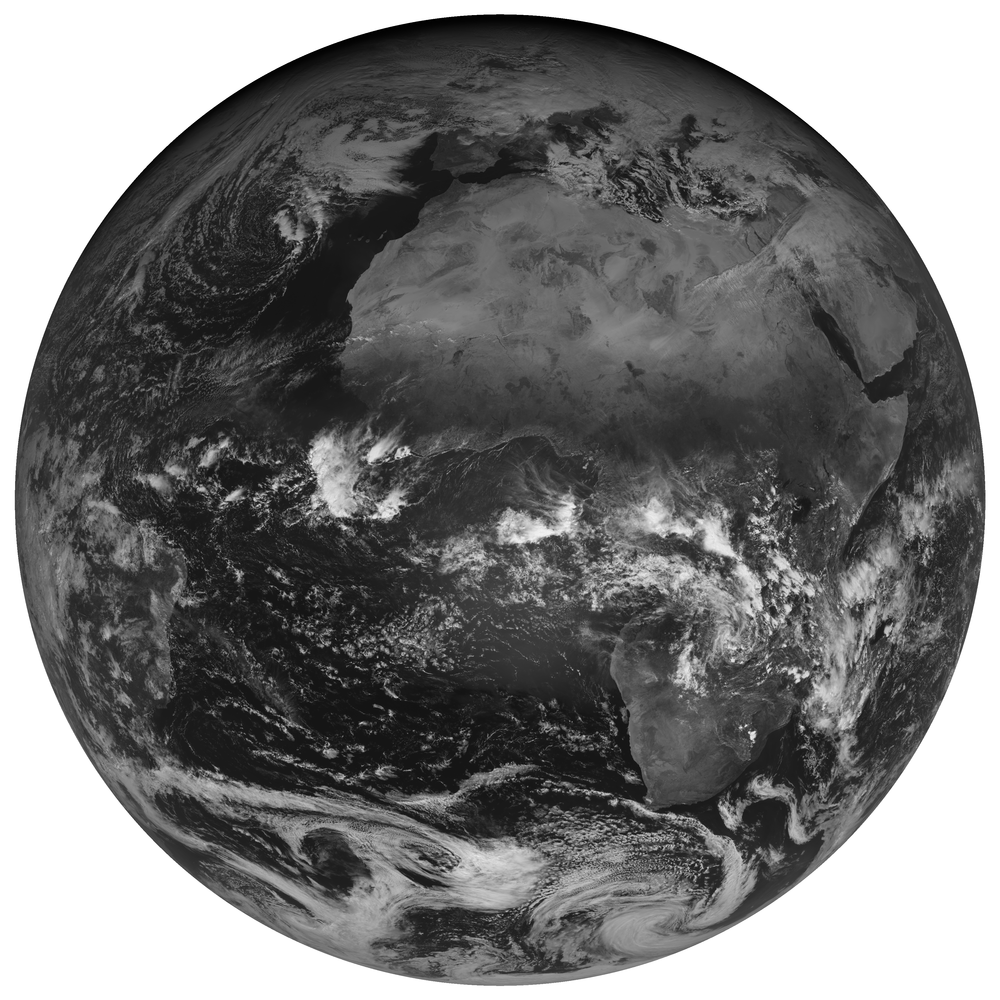

In [36]:
scn.show(0.6)

In [37]:
print(scn)

<xarray.DataArray 'ch1' (y: 3712, x: 3712)>
dask.array<shape=(3712, 3712), dtype=float32, chunksize=(3712, 3712)>
Coordinates:
  * x        (x) float64 -5.569e+06 -5.566e+06 ... 5.563e+06 5.566e+06
  * y        (y) float64 5.569e+06 5.566e+06 5.563e+06 ... -5.563e+06 -5.566e+06
Attributes:
    file_type:            nc_seviri_l1b
    polarization:         None
    wavelength:           (0.56, 0.635, 0.71)
    nc_key:               ch1
    modifiers:            ()
    add_offset:           -1.0641150400042534
    resolution:           3000.403165817
    standard_name:        toa_bidirectional_reflectance
    comment:              Radiance in mW m-2 sr-1(cm-1)-1 = add_offset + ( pi...
    valid_max:            1023
    name:                 VIS006
    sensor:               seviri
    units:                %
    calibration:          reflectance
    platform_name:        Meteosat-11
    valid_min:            0
    long_name:            SEVIRI visible 0.6 micron pixel counts
    level:     

In [15]:
available_bands = np.unique(np.asarray([x.name for x in scn.available_dataset_ids()]))
scn.load(available_bands)

#available_bands
scn.available_dataset_ids()
#scn.all_dataset_ids()

[DatasetID(name='IR_016', wavelength=(1.5, 1.64, 1.78), resolution=3000.403165817, polarization=None, calibration='counts', level=None, modifiers=()),
 DatasetID(name='IR_016', wavelength=(1.5, 1.64, 1.78), resolution=3000.403165817, polarization=None, calibration='radiance', level=None, modifiers=()),
 DatasetID(name='IR_016', wavelength=(1.5, 1.64, 1.78), resolution=3000.403165817, polarization=None, calibration='reflectance', level=None, modifiers=()),
 DatasetID(name='IR_039', wavelength=(3.48, 3.92, 4.36), resolution=3000.403165817, polarization=None, calibration='brightness_temperature', level=None, modifiers=()),
 DatasetID(name='IR_039', wavelength=(3.48, 3.92, 4.36), resolution=3000.403165817, polarization=None, calibration='counts', level=None, modifiers=()),
 DatasetID(name='IR_039', wavelength=(3.48, 3.92, 4.36), resolution=3000.403165817, polarization=None, calibration='radiance', level=None, modifiers=()),
 DatasetID(name='IR_087', wavelength=(8.3, 8.7, 9.1), resolution=3

In [23]:
scn.load(["IR_016"])

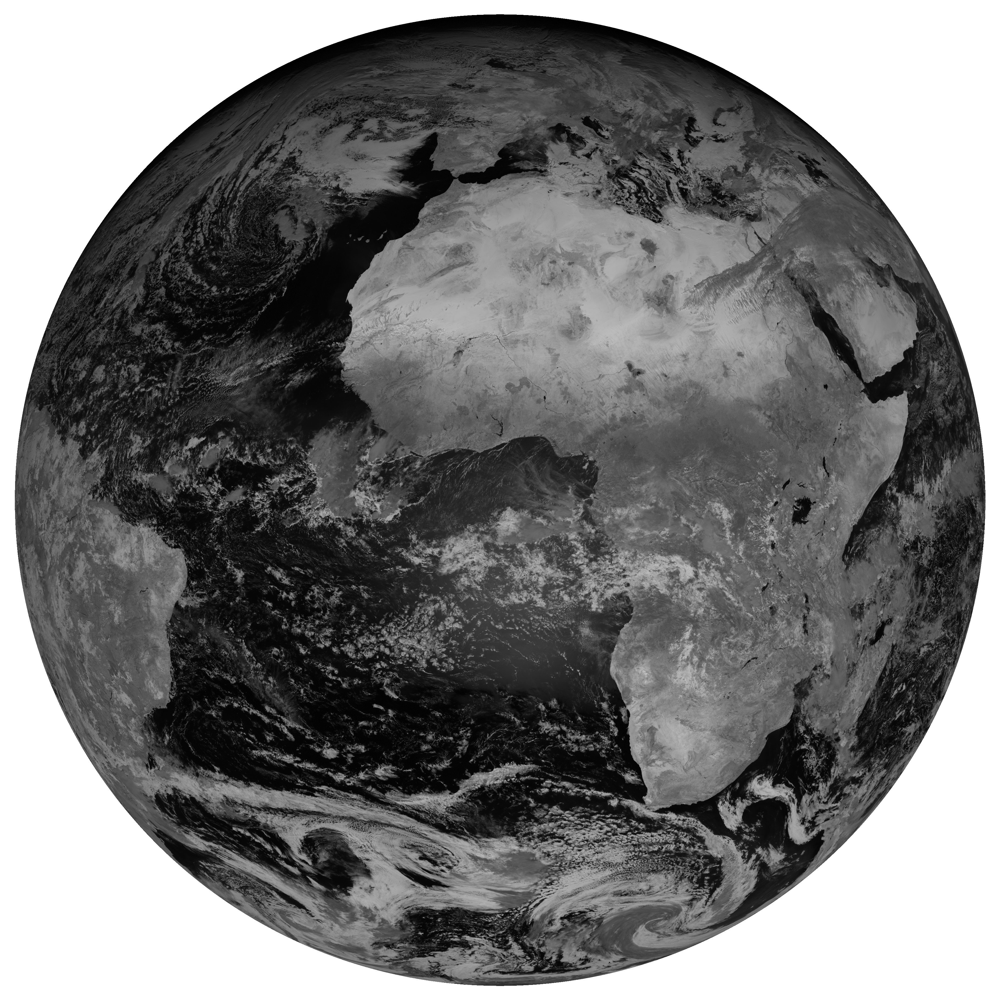

In [28]:
scn.show("IR_016")

In [ ]:
'''compo = "natural_color"
scn.load([compo])
scn.show(compo)
scn[compo] = scn[compo][:,100:-100,100:-100]'''